In [258]:
#import packages and libraries
import pandas as pd
import seaborn as sb
import plotly.express as px
import numpy as np
import statsmodels.api as sm
from patsy import dmatrices
from statsmodels.api import qqplot 
from statsmodels.stats.outliers_influence import variance_inflation_factor
import os
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

In [259]:
#find working directory
directory = os.getcwd()
print('Working directory ', directory)

Working directory  C:\Users\Kim Fowler


In [260]:
#load the data
df = pd.read_csv('Train.csv')

In [261]:
#EDA
df.head()

,Gender,Height (cm),Weight (kg),Blood Pressure (s/d),Cholesterol Level (mg/dL),BMI,Blood Glucose Level (mg/dL),Bone Density (g/cm²),Vision Sharpness,Hearing Ability (dB),...,Family History,Cognitive Function,Mental Health Status,Sleep Patterns,Stress Levels,Pollution Exposure,Sun Exposure,Education Level,Income Level,Age (years)
0,Male,171.148359,86.185197,151/109,259.465814,29.423017,157.652848,0.132868,0.200000,58.786198,...,NaN,44.059172,Good,Insomnia,2.797064,5.142344,7.108975,NaN,Medium,89
1,Male,172.946206,79.641937,134/112,263.630292,26.626847,118.507805,0.629534,0.267312,54.635270,...,Heart Disease,45.312298,Good,Normal,9.339930,7.272720,3.918489,Undergraduate,Medium,77
2,Female,155.945488,49.167058,160/101,207.846206,20.217553,143.587550,0.473487,0.248667,54.564632,...,Hypertension,56.246991,Poor,Insomnia,9.234637,8.500386,5.393408,NaN,Medium,70
3,Female,169.078298,56.017921,133/94,253.283779,19.595270,137.448581,1.184315,0.513818,79.722963,...,Hypertension,55.196092,Poor,Insomnia,4.693446,7.555511,2.745578,NaN,Low,52
4,Female,163.758355,73.966304,170/106,236.119899,27.582078,145.328695,0.434562,0.306864,52.479469,...,NaN,53.023379,Good,Normal,4.038537,9.429097,3.878435,Undergraduate,High,79


In [262]:
df.shape

(3000, 26)

In [263]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Gender                       3000 non-null   object 
 1   Height (cm)                  3000 non-null   float64
 2   Weight (kg)                  3000 non-null   float64
 3   Blood Pressure (s/d)         3000 non-null   object 
 4   Cholesterol Level (mg/dL)    3000 non-null   float64
 5   BMI                          3000 non-null   float64
 6   Blood Glucose Level (mg/dL)  3000 non-null   float64
 7   Bone Density (g/cm²)         3000 non-null   float64
 8   Vision Sharpness             3000 non-null   float64
 9   Hearing Ability (dB)         3000 non-null   float64
 10  Physical Activity Level      3000 non-null   object 
 11  Smoking Status               3000 non-null   object 
 12  Alcohol Consumption          1799 non-null   object 
 13  Diet              

In [264]:
#Detect and treat nulls
df.isnull().sum()

Gender                            0
Height (cm)                       0
Weight (kg)                       0
Blood Pressure (s/d)              0
Cholesterol Level (mg/dL)         0
BMI                               0
Blood Glucose Level (mg/dL)       0
Bone Density (g/cm²)              0
Vision Sharpness                  0
Hearing Ability (dB)              0
Physical Activity Level           0
Smoking Status                    0
Alcohol Consumption            1201
Diet                              0
Chronic Diseases               1299
Medication Use                 1198
Family History                 1451
Cognitive Function                0
Mental Health Status              0
Sleep Patterns                    0
Stress Levels                     0
Pollution Exposure                0
Sun Exposure                      0
Education Level                 627
Income Level                      0
Age (years)                       0
dtype: int64

In [265]:
df['Alcohol Consumption'].fillna('None', inplace=True)

In [266]:
#Check for duplicates
print(df.duplicated().value_counts())

False    3000
Name: count, dtype: int64


In [267]:
#summary statistics
#Create new Dataframe with only continous vars
cont_predictions = pd.DataFrame(data=df, columns=['Height (cm)', 'Weight (kg)'
                                                  , 'Cholesterol Level (mg/dL)','BMI','Blood Glucose Level (mg/dL)'
                                                  ,'Stress Levels', 'Bone Density (g/cm²)','Sun Exposure', 'Hearing Ability (dB)', 'Vision Sharpness','Age (years)'])
cont_predictions.describe()

,Height (cm),Weight (kg),Cholesterol Level (mg/dL),BMI,Blood Glucose Level (mg/dL),Stress Levels,Bone Density (g/cm²),Sun Exposure,Hearing Ability (dB),Vision Sharpness,Age (years)
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,168.590835,72.537260,234.029794,25.550146,126.653909,5.476507,0.931899,5.955785,47.016214,0.474591,53.485667
std,9.293006,13.190734,24.521436,4.367322,18.226124,2.584901,0.443550,3.474595,14.336464,0.209726,20.569690
min,141.130985,32.537672,148.811514,12.049900,69.866884,1.000428,-0.219787,0.002055,0.000000,0.200000,18.000000
25%,161.629515,63.222773,216.756601,22.454115,114.392605,3.221745,0.561063,2.873285,36.734775,0.281671,36.000000
50%,168.215632,71.448651,234.376822,25.352113,126.802186,5.496618,0.939585,5.956789,46.963733,0.462070,53.000000
75%,175.522665,81.702801,250.646674,28.403543,139.377079,7.680320,1.294570,8.991349,56.828847,0.639498,72.000000
max,198.112215,123.598603,331.300589,43.329869,185.736144,9.996323,1.999829,11.992504,94.003824,1.062537,89.000000


In [268]:
print('Median')
cont_predictions.median()

Median


Height (cm)                    168.215632
Weight (kg)                     71.448651
Cholesterol Level (mg/dL)      234.376822
BMI                             25.352113
Blood Glucose Level (mg/dL)    126.802186
Stress Levels                    5.496618
Bone Density (g/cm²)             0.939585
Sun Exposure                     5.956789
Hearing Ability (dB)            46.963733
Vision Sharpness                 0.462070
Age (years)                     53.000000
dtype: float64

In [269]:
#summary statistics
#Create new Dataframe with only categorical vars
cat_predictions = pd.DataFrame(data=df, columns=['Gender', 'Physical Activity Level'
                                                  , 'Smoking Status','Alcohol Consumption','Diet'
                                                  ,'Chronic Diseases'])
cat_predictions.describe()

,Gender,Physical Activity Level,Smoking Status,Alcohol Consumption,Diet,Chronic Diseases
count,3000,3000,3000,3000,3000,1701
unique,2,3,3,3,4,3
top,Female,Moderate,Former,None,Balanced,Hypertension
freq,1511,1407,1181,1201,1183,676


In [270]:
cat_predictions.mode()

,Gender,Physical Activity Level,Smoking Status,Alcohol Consumption,Diet,Chronic Diseases
0,Female,Moderate,Former,None,Balanced,Hypertension


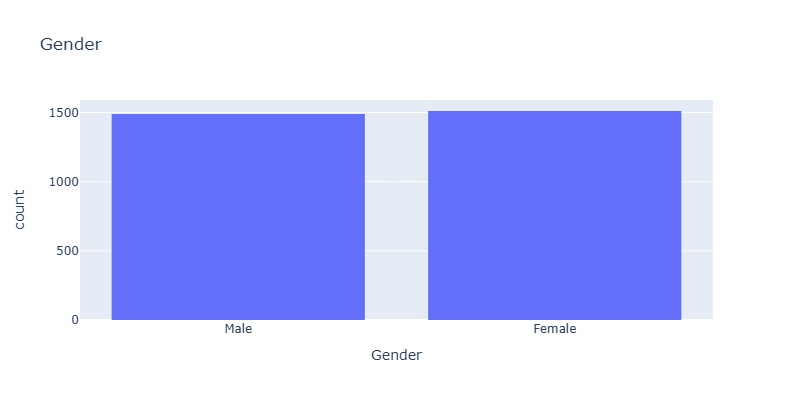

In [271]:
fig = px.histogram(df, x="Gender", title = 'Gender', width=500, height=400)
fig.show()

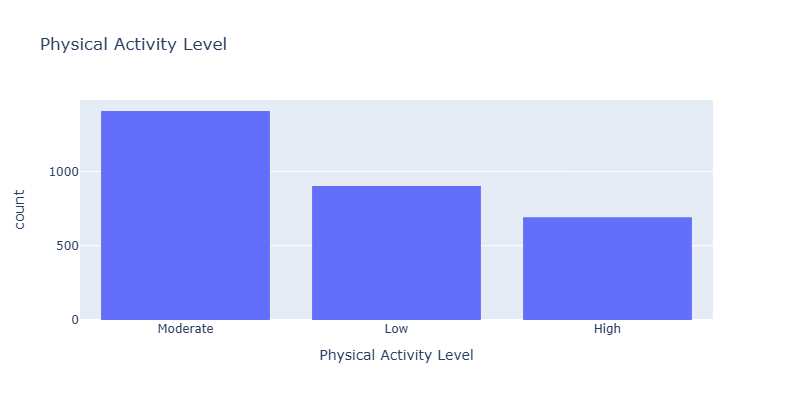

In [272]:
fig = px.histogram(df, x="Physical Activity Level", title = 'Physical Activity Level', width=500, height=400)
fig.show()

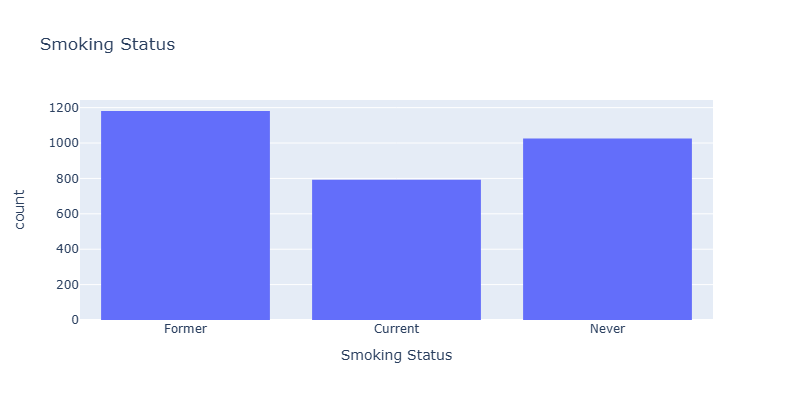

In [273]:
fig = px.histogram(df, x="Smoking Status", title ='Smoking Status', width=500, height=400)
fig.show()

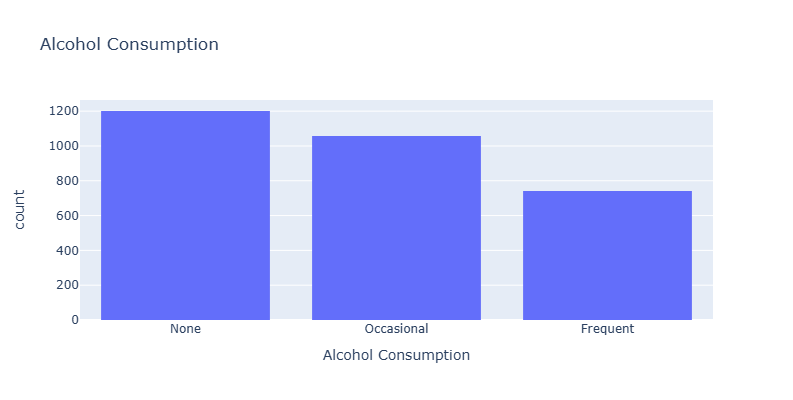

In [274]:
fig = px.histogram(df, x='Alcohol Consumption', title ='Alcohol Consumption', width=500, height=400)
fig.show()

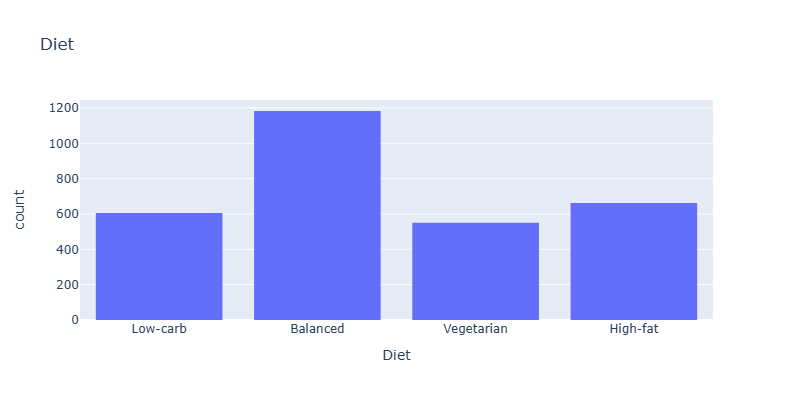

In [275]:
fig = px.histogram(df, x='Diet', title ='Diet', width=500, height=400)
fig.show()

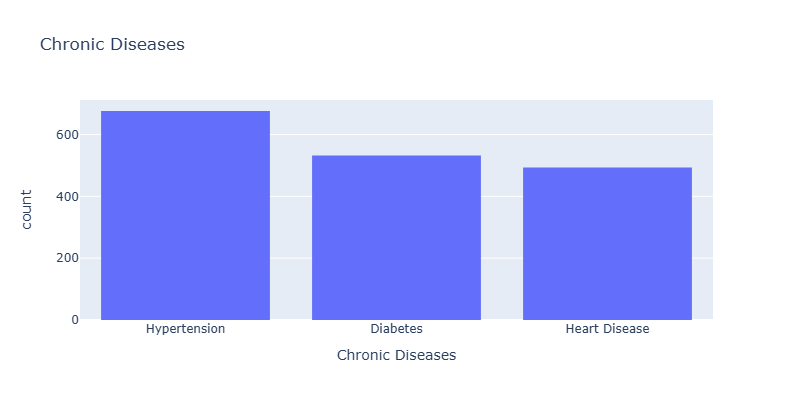

In [276]:
fig = px.histogram(df, x='Chronic Diseases', title ='Chronic Diseases', width=500, height=400)
fig.show()

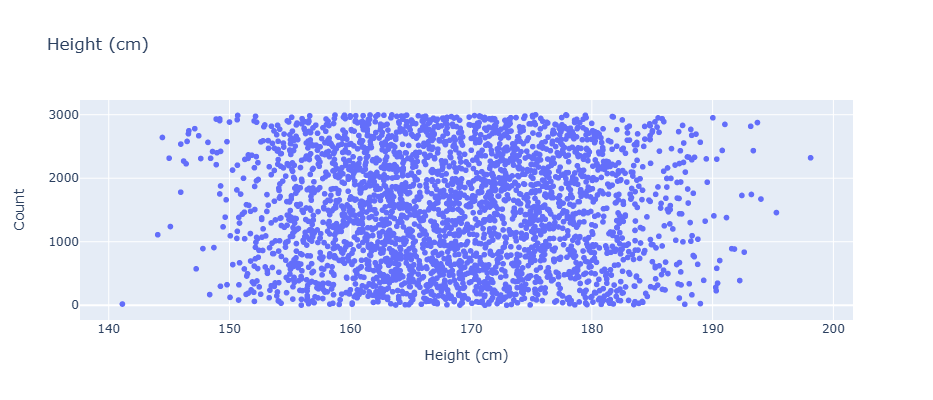

In [277]:
fig = px.scatter(df, x='Height (cm)', title='Height (cm)', labels={"index":"Count"}, width=800, height=400)
fig.show()

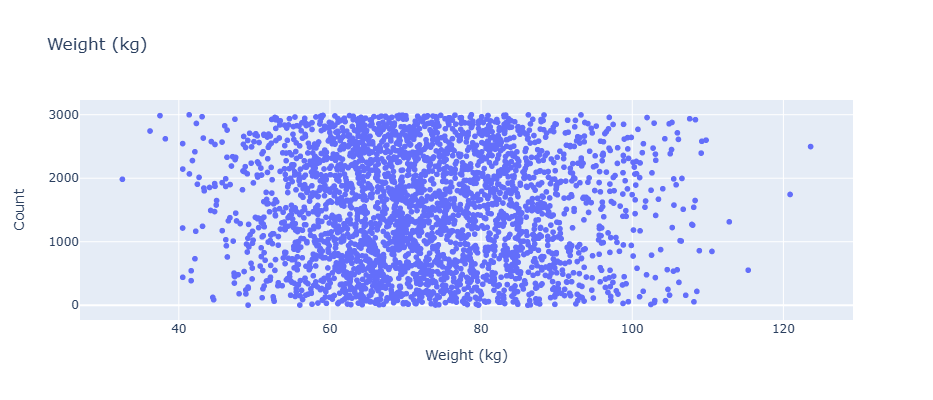

In [278]:
fig = px.scatter(df, x='Weight (kg)', title='Weight (kg)', labels={"index":"Count"}, width=800, height=400)
fig.show()

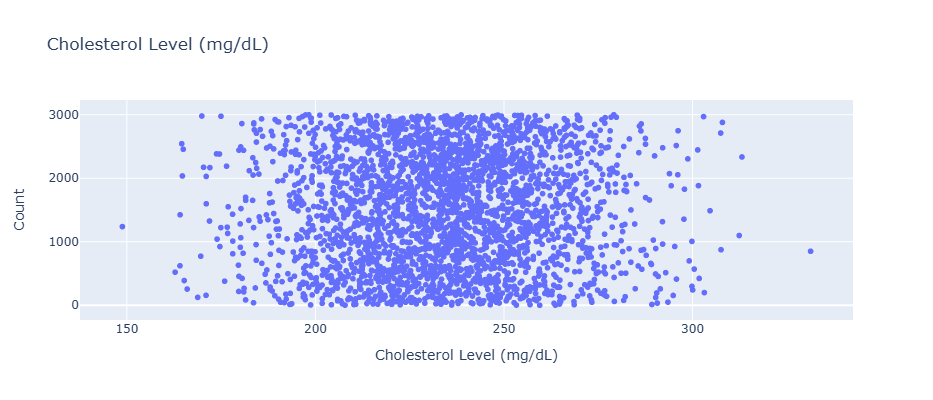

In [279]:
fig = px.scatter(df, x='Cholesterol Level (mg/dL)', title='Cholesterol Level (mg/dL)', labels={"index":"Count"}, width=800, height=400)
fig.show()

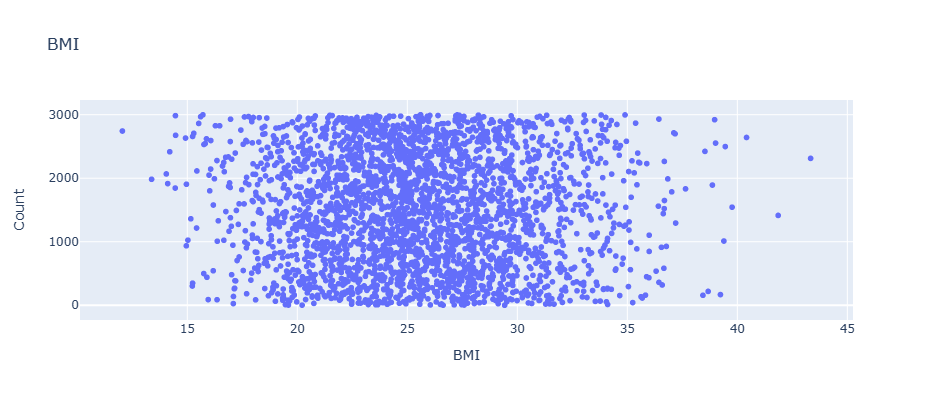

In [280]:
fig = px.scatter(df, x='BMI', title='BMI', labels={"index":"Count"}, width=800, height=400)
fig.show()

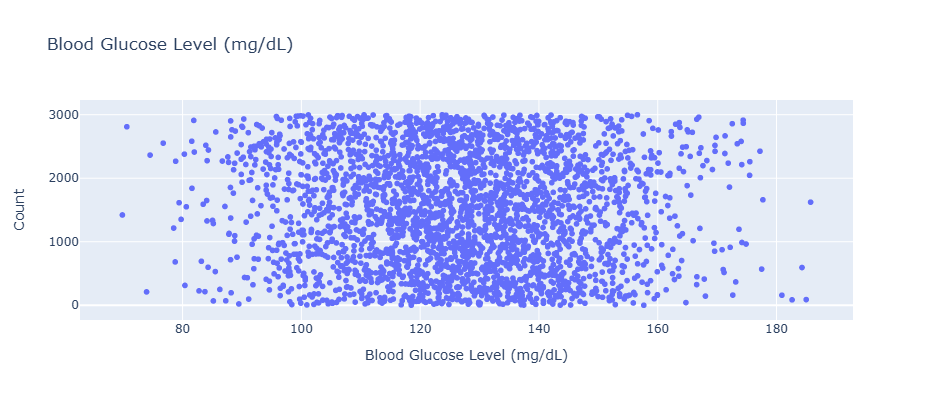

In [281]:
fig = px.scatter(df, x='Blood Glucose Level (mg/dL)', title='Blood Glucose Level (mg/dL)', labels={"index":"Count"}, width=800, height=400)
fig.show()

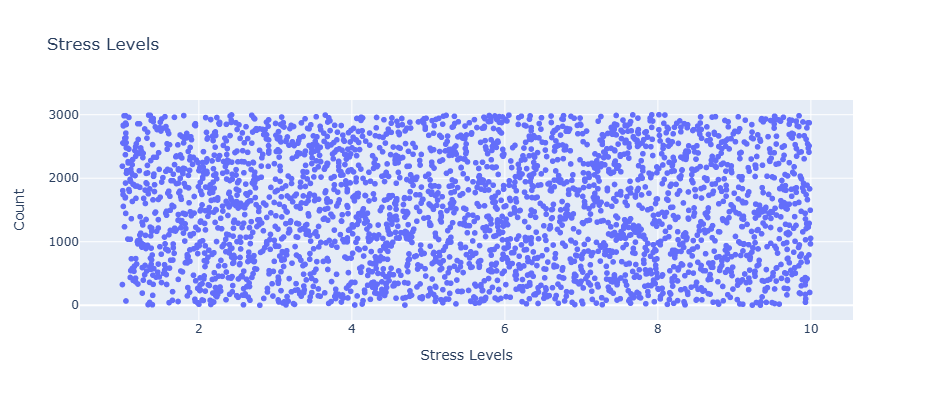

In [282]:
fig = px.scatter(df, x='Stress Levels', title='Stress Levels', labels={"index":"Count"}, width=800, height=400)
fig.show()

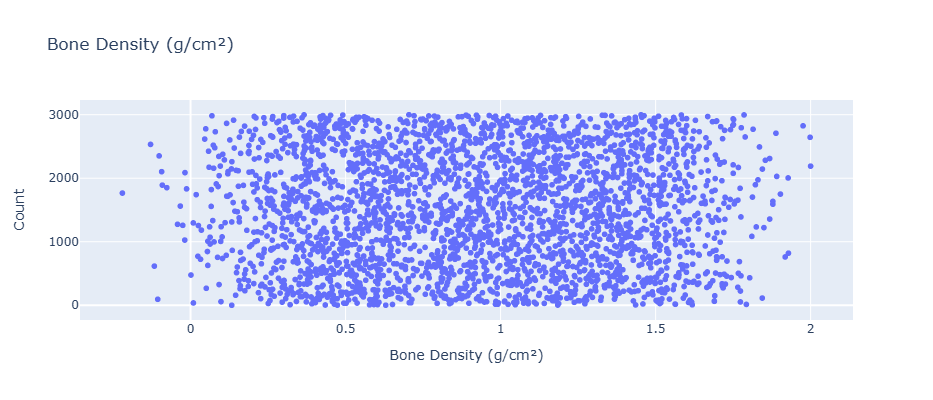

In [283]:
fig = px.scatter(df, x='Bone Density (g/cm²)', title='Bone Density (g/cm²)', labels={"index":"Count"}, width=800, height=400)
fig.show()

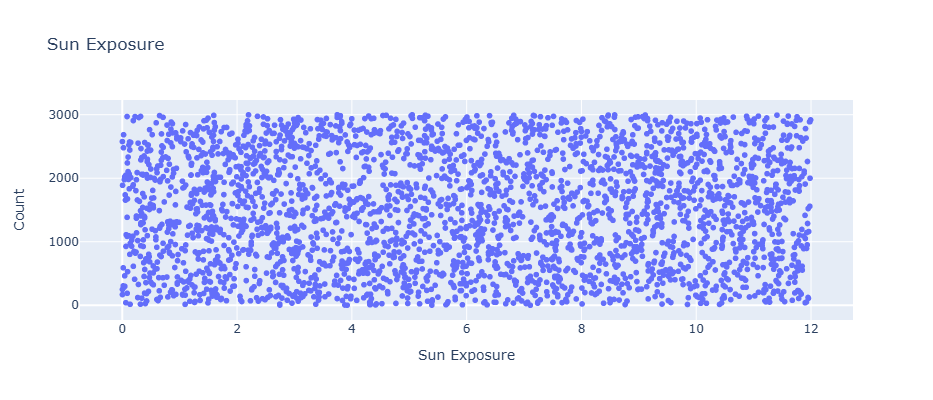

In [284]:
fig = px.scatter(df, x='Sun Exposure', title='Sun Exposure', labels={"index":"Count"}, width=800, height=400)
fig.show()

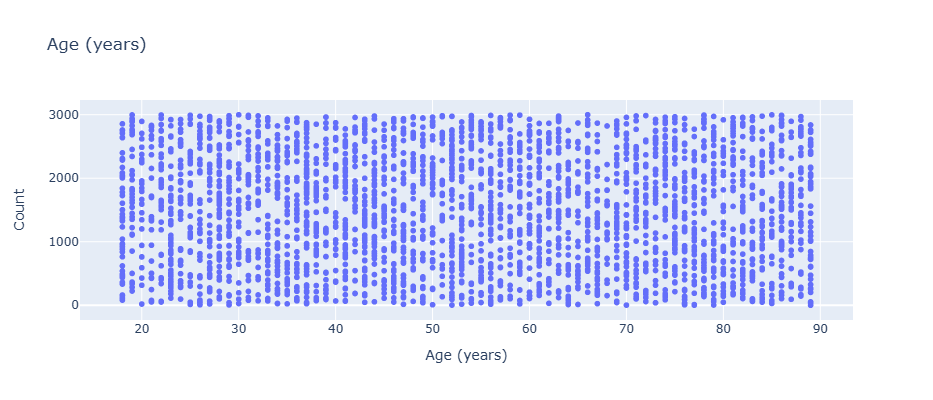

In [285]:
fig = px.scatter(df, x='Age (years)', title='Age (years)', labels={"index":"Count"}, width=800, height=400)
fig.show()

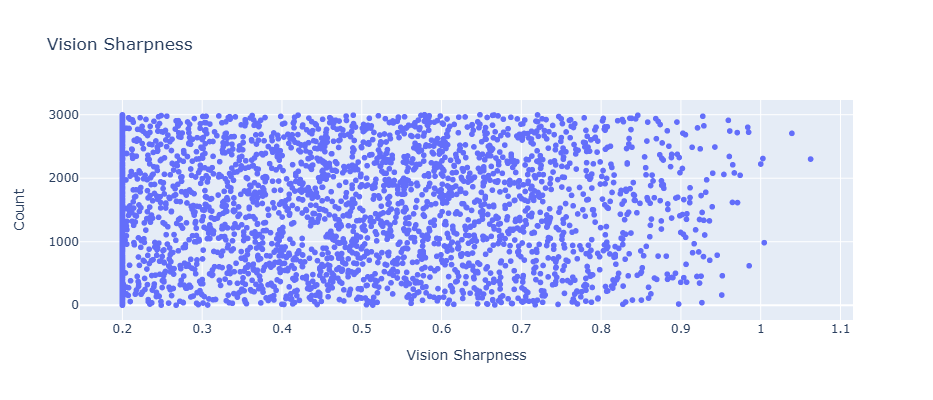

In [286]:
fig = px.scatter(df, x='Vision Sharpness', title='Vision Sharpness', labels={"index":"Count"}, width=800, height=400)
fig.show()

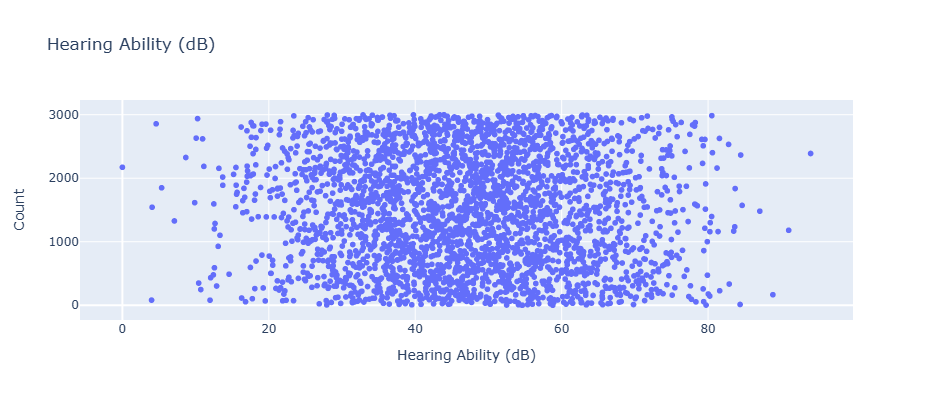

In [287]:
fig = px.scatter(df, x='Hearing Ability (dB)', title='Hearing Ability (dB)', labels={"index":"Count"}, width=800, height=400)
fig.show()

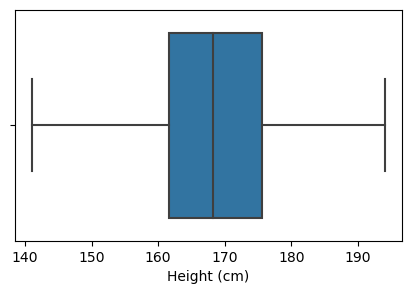

In [290]:
#Check for outliers
fig, ax = plt.subplots(figsize=(5, 3))
sb.boxplot(x='Height (cm)', data=df)
plt.show()

In [289]:
#treat the outliers
df['Height (cm)'] = np.where(df['Height (cm)'] > 195, 168, df['Height (cm)'])

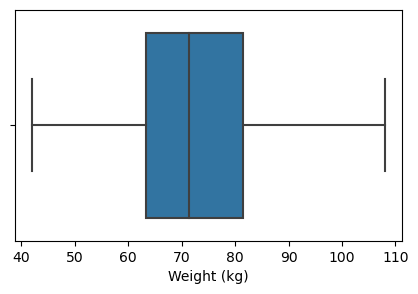

In [250]:
fig, ax = plt.subplots(figsize=(5, 3))
sb.boxplot(x='Weight (kg)', data=df)
plt.show()

In [291]:
#treat the outliers
df['Weight (kg)'] = np.where(df['Weight (kg)'] > 108, 71, df['Weight (kg)'])
df['Weight (kg)'] = np.where(df['Weight (kg)'] < 42, 71, df['Weight (kg)'])

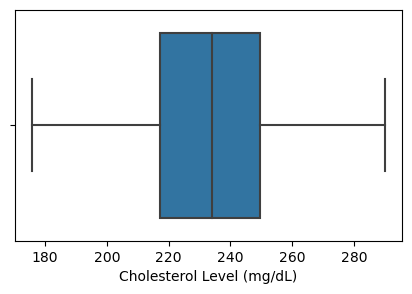

In [144]:
fig, ax = plt.subplots(figsize=(5, 3))
sb.boxplot(x='Cholesterol Level (mg/dL)', data=df)
plt.show()

In [292]:
df['Cholesterol Level (mg/dL)'] = np.where(df['Cholesterol Level (mg/dL)'] > 290, 234, df['Cholesterol Level (mg/dL)'])
df['Cholesterol Level (mg/dL)'] = np.where(df['Cholesterol Level (mg/dL)'] < 175, 234, df['Cholesterol Level (mg/dL)'])

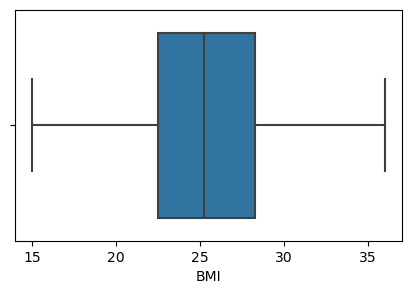

In [251]:
fig, ax = plt.subplots(figsize=(5, 3))
sb.boxplot(x='BMI', data=df)
plt.show()

In [293]:
df['BMI'] = np.where(df['BMI'] > 36, 25, df['BMI'])
df['BMI'] = np.where(df['BMI'] < 15, 25, df['BMI'])

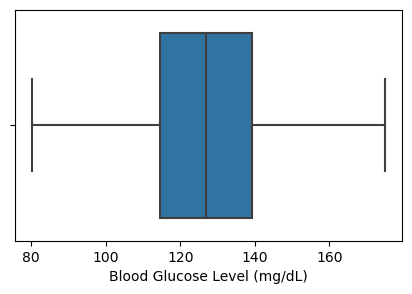

In [295]:
fig, ax = plt.subplots(figsize=(5, 3))
sb.boxplot(x='Blood Glucose Level (mg/dL)', data=df)
plt.show()

In [294]:
df['Blood Glucose Level (mg/dL)'] = np.where(df['Blood Glucose Level (mg/dL)'] > 175, 126.8, df['Blood Glucose Level (mg/dL)'])
df['Blood Glucose Level (mg/dL)'] = np.where(df['Blood Glucose Level (mg/dL)'] < 80, 126.8, df['Blood Glucose Level (mg/dL)'])

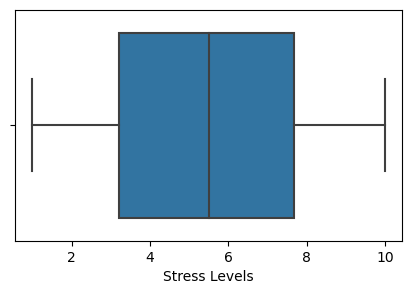

In [296]:
fig, ax = plt.subplots(figsize=(5, 3))
sb.boxplot(x='Stress Levels', data=df)
plt.show()

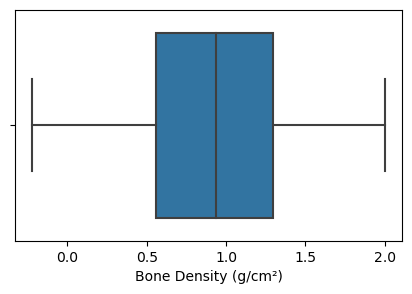

In [297]:
fig, ax = plt.subplots(figsize=(5, 3))
sb.boxplot(x='Bone Density (g/cm²)', data=df)
plt.show()

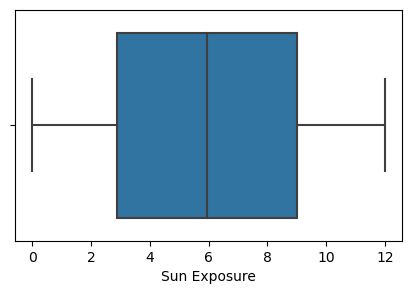

In [298]:
fig, ax = plt.subplots(figsize=(5,3))
sb.boxplot(x='Sun Exposure', data=df)
plt.show()

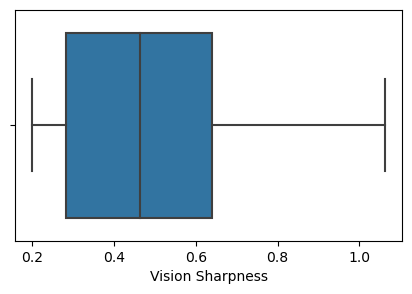

In [154]:
fig, ax = plt.subplots(figsize=(5, 3))
sb.boxplot(x='Vision Sharpness', data=df)
plt.show()

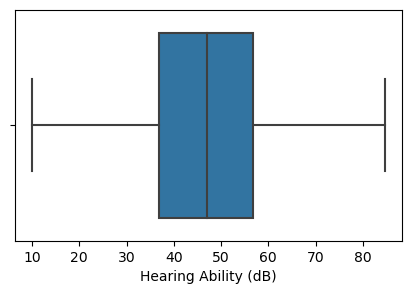

In [300]:
fig, ax = plt.subplots(figsize=(5, 3))
sb.boxplot(x='Hearing Ability (dB)', data=df)
plt.show()

In [299]:
df['Hearing Ability (dB)'] = np.where(df['Hearing Ability (dB)'] > 85, 46.96, df['Hearing Ability (dB)'])
df['Hearing Ability (dB)'] = np.where(df['Hearing Ability (dB)'] < 10, 46.96, df['Hearing Ability (dB)'])

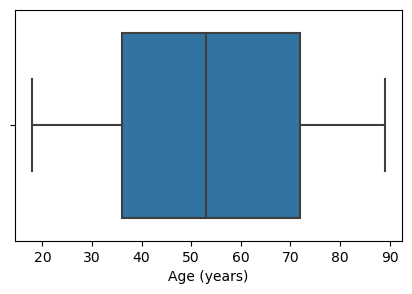

In [301]:
fig, ax = plt.subplots(figsize=(5, 3))
sb.boxplot(x='Age (years)', data=df)
plt.show()

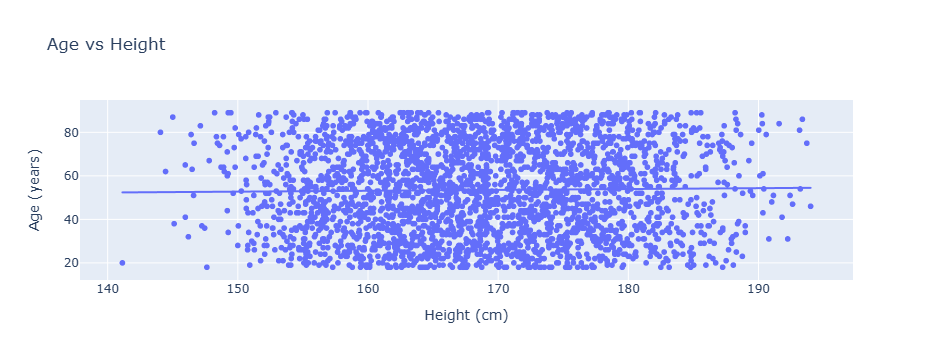

In [302]:
#Visulizations: univariate and bivariate for predicting varables and target variable
fig = px.scatter(df, x='Height (cm)', y='Age (years)', title='Age vs Height', trendline='ols')
fig.show()

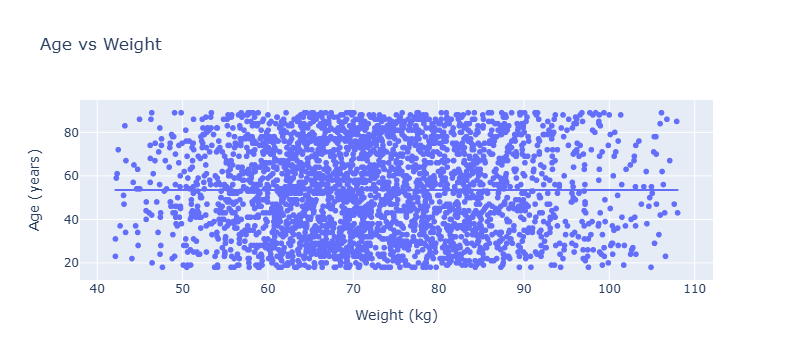

In [303]:
fig = px.scatter(df, x='Weight (kg)', y='Age (years)', title='Age vs Weight', trendline='ols')
fig.show()

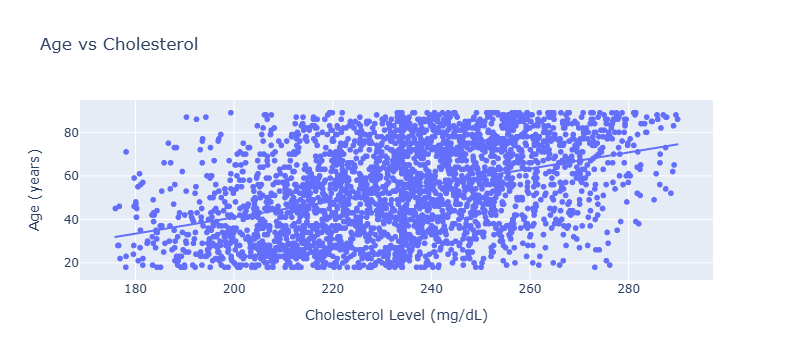

In [304]:
fig = px.scatter(df, x='Cholesterol Level (mg/dL)', y='Age (years)', title='Age vs Cholesterol', trendline='ols')
fig.show()

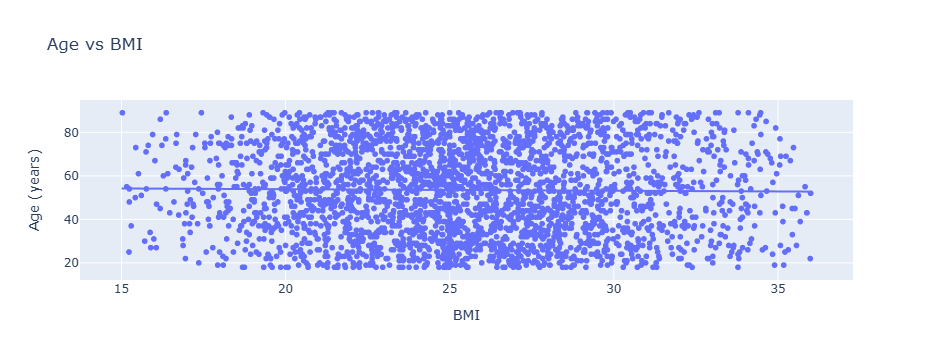

In [305]:
fig = px.scatter(df, x='BMI', y='Age (years)', title='Age vs BMI', trendline='ols')
fig.show()

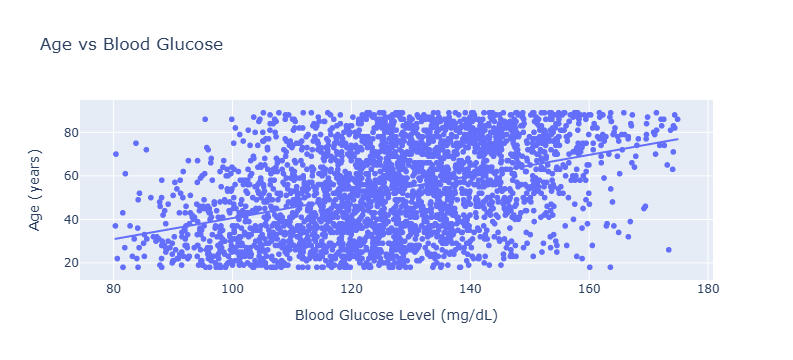

In [306]:
fig = px.scatter(df, x='Blood Glucose Level (mg/dL)', y='Age (years)', title='Age vs Blood Glucose', trendline='ols')
fig.show()

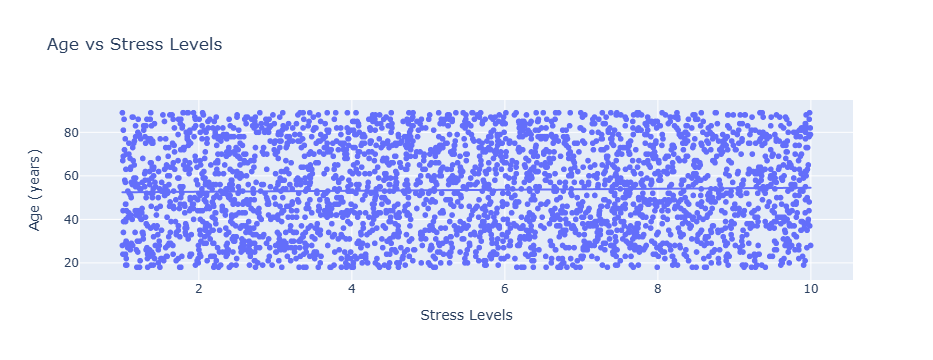

In [307]:
fig = px.scatter(df, x='Stress Levels', y='Age (years)', title='Age vs Stress Levels', trendline='ols')
fig.show()

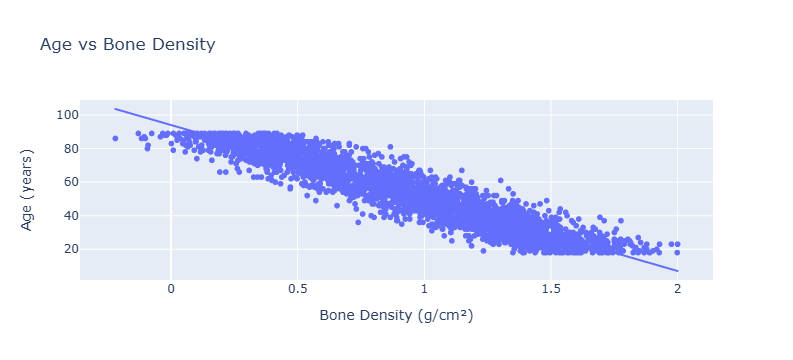

In [308]:
fig = px.scatter(df, x='Bone Density (g/cm²)', y='Age (years)', title='Age vs Bone Density', trendline='ols')
fig.show()

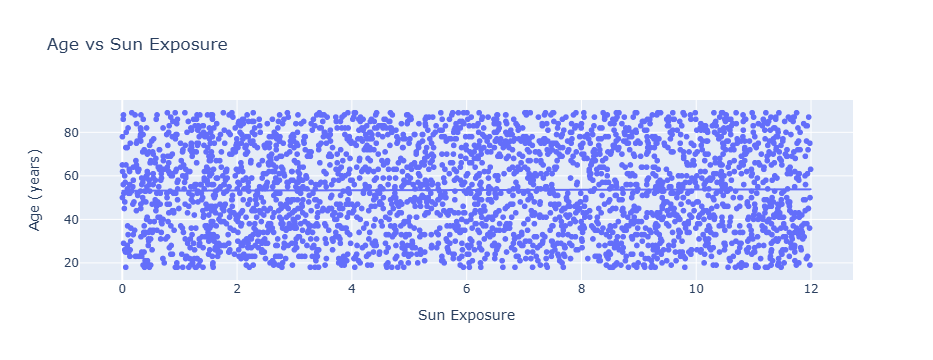

In [309]:
fig = px.scatter(df, x='Sun Exposure', y='Age (years)', title='Age vs Sun Exposure', trendline='ols')
fig.show()

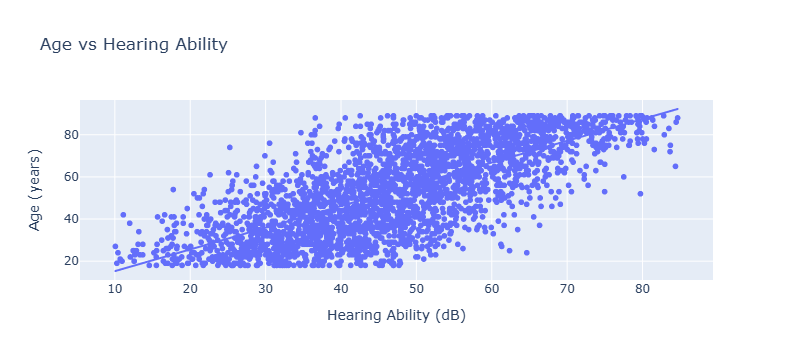

In [310]:
fig = px.scatter(df, x='Hearing Ability (dB)', y='Age (years)', title='Age vs Hearing Ability', trendline='ols')
fig.show()

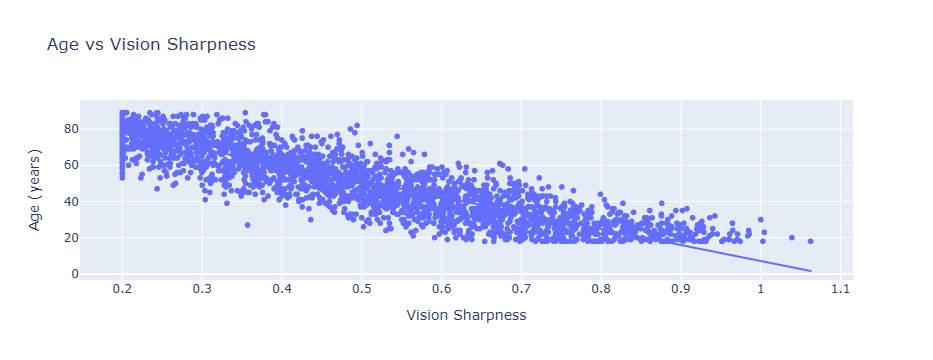

In [311]:
fig = px.scatter(df, x='Vision Sharpness', y='Age (years)', title='Age vs Vision Sharpness', trendline='ols')
fig.show()

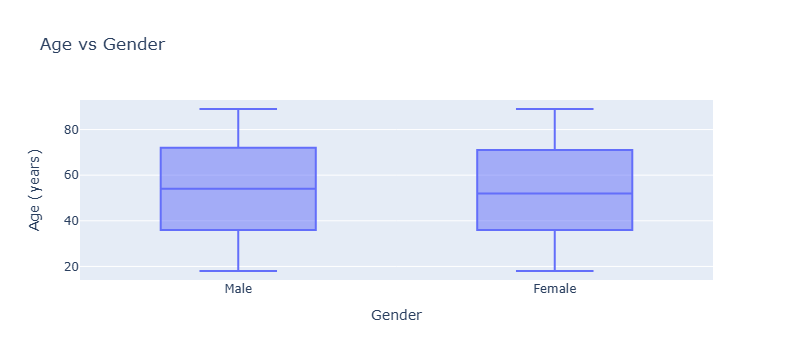

In [312]:
fig = px.box(df, x='Gender', y='Age (years)', title='Age vs Gender')
fig.show()

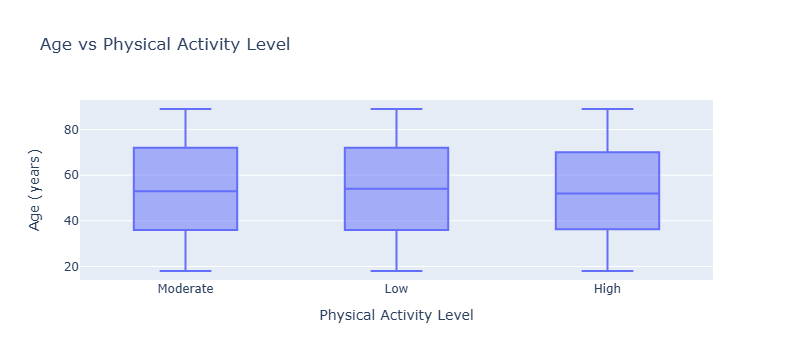

In [313]:
fig = px.box(df, x='Physical Activity Level', y='Age (years)', title='Age vs Physical Activity Level')
fig.show()

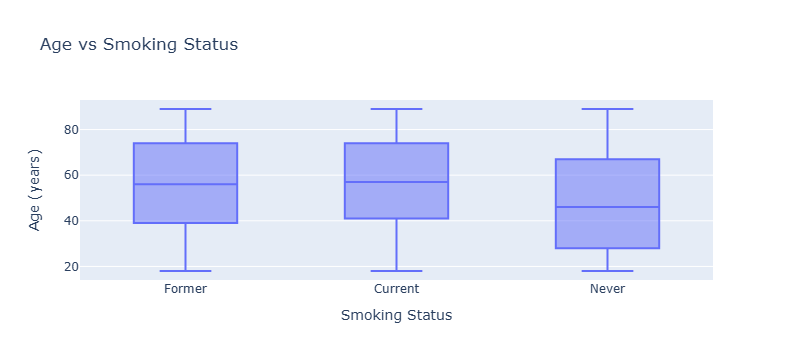

In [314]:
fig = px.box(df, x='Smoking Status', y='Age (years)', title='Age vs Smoking Status')
fig.show()

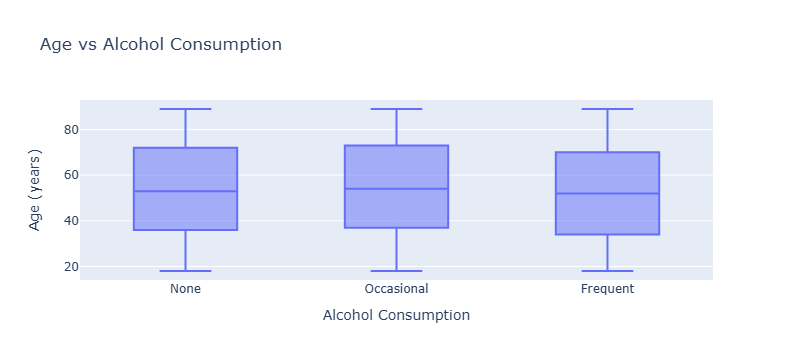

In [315]:
fig = px.box(df, x='Alcohol Consumption', y='Age (years)', title='Age vs Alcohol Consumption')
fig.show()

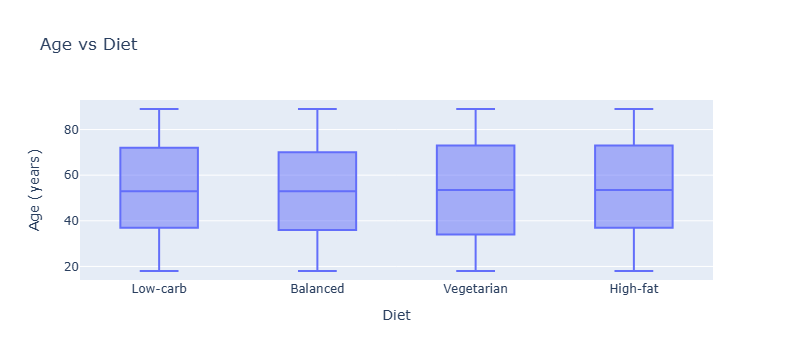

In [316]:
fig = px.box(df, x='Diet', y='Age (years)', title='Age vs Diet')
fig.show()

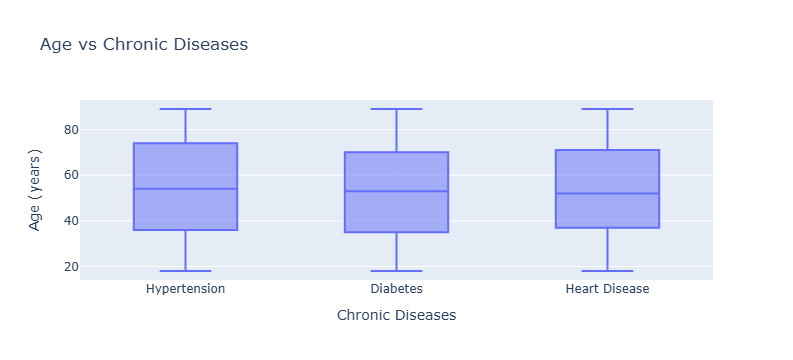

In [317]:
fig = px.box(df, x='Chronic Diseases', y='Age (years)', title='Age vs Chronic Diseases')
fig.show()

In [318]:
#One hot encoding
df_clean = pd.get_dummies(df, columns=['Gender', 'Physical Activity Level','Smoking Status','Alcohol Consumption','Diet','Chronic Diseases'], dtype=int, drop_first=True)

In [319]:
df_clean.head()

,Height (cm),Weight (kg),Blood Pressure (s/d),Cholesterol Level (mg/dL),BMI,Blood Glucose Level (mg/dL),Bone Density (g/cm²),Vision Sharpness,Hearing Ability (dB),Medication Use,...,Physical Activity Level_Moderate,Smoking Status_Former,Smoking Status_Never,Alcohol Consumption_None,Alcohol Consumption_Occasional,Diet_High-fat,Diet_Low-carb,Diet_Vegetarian,Chronic Diseases_Heart Disease,Chronic Diseases_Hypertension
0,171.148359,86.185197,151/109,259.465814,29.423017,157.652848,0.132868,0.200000,58.786198,NaN,...,1,1,0,1,0,0,1,0,0,0
1,172.946206,79.641937,134/112,263.630292,26.626847,118.507805,0.629534,0.267312,54.635270,NaN,...,0,0,0,0,1,0,0,0,0,1
2,155.945488,49.167058,160/101,207.846206,20.217553,143.587550,0.473487,0.248667,54.564632,Regular,...,1,0,1,1,0,0,0,0,0,1
3,169.078298,56.017921,133/94,253.283779,19.595270,137.448581,1.184315,0.513818,79.722963,Occasional,...,1,0,1,1,0,0,0,0,0,0
4,163.758355,73.966304,170/106,236.119899,27.582078,145.328695,0.434562,0.306864,52.479469,NaN,...,0,1,0,0,0,0,0,1,0,0


In [320]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 32 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Height (cm)                       3000 non-null   float64
 1   Weight (kg)                       3000 non-null   float64
 2   Blood Pressure (s/d)              3000 non-null   object 
 3   Cholesterol Level (mg/dL)         3000 non-null   float64
 4   BMI                               3000 non-null   float64
 5   Blood Glucose Level (mg/dL)       3000 non-null   float64
 6   Bone Density (g/cm²)              3000 non-null   float64
 7   Vision Sharpness                  3000 non-null   float64
 8   Hearing Ability (dB)              3000 non-null   float64
 9   Medication Use                    1802 non-null   object 
 10  Family History                    1549 non-null   object 
 11  Cognitive Function                3000 non-null   float64
 12  Mental

In [332]:
#Export the clean dataset
df_clean.to_csv(r'C:\Kim\WGU\Capstone\KFowler_AgePrediction_Capstone.csv')

In [321]:
target = pd.DataFrame(df_clean[['Age (years)']])
predictors = pd.DataFrame(df_clean[['Cholesterol Level (mg/dL)', 'Blood Glucose Level (mg/dL)', 'Bone Density (g/cm²)'
                                   ,'Gender_Male','Physical Activity Level_Low','Physical Activity Level_Moderate'
                                   , 'Smoking Status_Former', 'Smoking Status_Never','Alcohol Consumption_None'
                                   ,'Alcohol Consumption_Occasional','Diet_High-fat','Diet_Low-carb'
                                   ,'Diet_Vegetarian','Chronic Diseases_Heart Disease','Chronic Diseases_Hypertension'
                                   , 'Vision Sharpness', 'Hearing Ability (dB)']])

In [322]:
#Perform Multiple Linear Regression Analysis
predictors = sm.add_constant(predictors)
model1 = sm.OLS(target, predictors).fit()
model1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Age (years)   R-squared:                       0.928
Model:                            OLS   Adj. R-squared:                  0.928
Method:                 Least Squares   F-statistic:                     2262.
Date:                Wed, 22 Jan 2025   Prob (F-statistic):               0.00
Time:                        20:20:24   Log-Likelihood:                -9380.3
No. Observations:                3000   AIC:                         1.880e+04
Df Residuals:                    2982   BIC:                         1.890e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const                               72.6728      1.652     43.982      0.000      69.433      75.913
Cholesterol Level (mg/dL)            0.0336      0.005      6.889      0.000       0.024       0.043
Blood Glucose Level (mg/dL)          0.0426      0.006      6.829      0.000       0.030       0.055
Bone Density (g/cm²)               -25.8688      0.456    -56.773      0.000     -26.762     -24.975
Gender_Male                          0.1551      0.203      0.766      0.444      -0.242       0.552
Physical Activity Level_Low          0.1042      0.281      0.371      0.710      -0.446       0.654
Physical Activity Level_Moderate     0.4002      0.258      1.554      0.120      -0.105       0.905
Smoking Status_Former               -0.0030      0.255     -0.012      0.991      -0.503       0.497
Smoking Status_Never                -0.5798      0.266     -2.181      0.029      -1.101      -0.059
Alcohol Consumption_None             0.0587      0.259      0.227      0.821      -0.449       0.567
Alcohol Consumption_Occasional       0.0601      0.266      0.226      0.821      -0.461       0.581
Diet_High-fat                       -0.4692      0.269     -1.743      0.081      -0.997       0.059
Diet_Low-carb                       -0.1731      0.277     -0.624      0.532      -0.717       0.371
Diet_Vegetarian                     -0.0719      0.286     -0.251      0.802      -0.633       0.489
Chronic Diseases_Heart Disease       0.2540      0.281      0.903      0.367      -0.298       0.806
Chronic Diseases_Hypertension        0.1142      0.250      0.458      0.647      -0.375       0.604
Vision Sharpness                   -32.6177      0.931    -35.026      0.000     -34.444     -30.792
Hearing Ability (dB)                 0.1506      0.010     15.424      0.000       0.131       0.170
==============================================================================
Omnibus:                        0.270   Durbin-Watson:                   2.035
Prob(Omnibus):                  0.874   Jarque-Bera (JB):                0.311
Skew:                           0.018   Prob(JB):                        0.856
Kurtosis:                       2.966   Cond. No.                     4.50e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.5e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [323]:
#rename columns
vif_test = pd.DataFrame(df_clean)
vif_test.rename(columns={'Age (years)':'Age', 'Cholesterol Level (mg/dL)':'Cholesterol_Level', 'Blood Glucose Level (mg/dL)':'Blood_Glucose','Bone Density (g/cm²)':'Bone_Density','Physical Activity Level_Low':'Physical_Activity_Level_Low'
                                   ,'Physical Activity Level_Moderate':'Physical_Activity_Level_Moderate'
                                   ,'Smoking Status_Former':'Smoking_Status_Former', 'Smoking Status_Never':'Smoking_Status_Never'
                                   , 'Alcohol Consumption_None':'Alcohol_Consumption_None', 'Alcohol Consumption_Occasional':'Alcohol_Consumption_Occasional'
                                   ,'Chronic Diseases_Heart Disease':'Chronic_Diseases_Heart_Disease', 'Chronic Diseases_Hypertension':'Chronic_Diseases_Hypertension'
                        ,'Diet_High-fat':'Diet_Highfat','Diet_Low-carb':'Diet_Lowcarb'
                        , 'Vision Sharpness':'Vision_Sharpness', 'Hearing Ability (dB)':'Hearing_Ability'}, inplace=True)

In [324]:
vif_test.head()

,Height (cm),Weight (kg),Blood Pressure (s/d),Cholesterol_Level,BMI,Blood_Glucose,Bone_Density,Vision_Sharpness,Hearing_Ability,Medication Use,...,Physical_Activity_Level_Moderate,Smoking_Status_Former,Smoking_Status_Never,Alcohol_Consumption_None,Alcohol_Consumption_Occasional,Diet_Highfat,Diet_Lowcarb,Diet_Vegetarian,Chronic_Diseases_Heart_Disease,Chronic_Diseases_Hypertension
0,171.148359,86.185197,151/109,259.465814,29.423017,157.652848,0.132868,0.200000,58.786198,NaN,...,1,1,0,1,0,0,1,0,0,0
1,172.946206,79.641937,134/112,263.630292,26.626847,118.507805,0.629534,0.267312,54.635270,NaN,...,0,0,0,0,1,0,0,0,0,1
2,155.945488,49.167058,160/101,207.846206,20.217553,143.587550,0.473487,0.248667,54.564632,Regular,...,1,0,1,1,0,0,0,0,0,1
3,169.078298,56.017921,133/94,253.283779,19.595270,137.448581,1.184315,0.513818,79.722963,Occasional,...,1,0,1,1,0,0,0,0,0,0
4,163.758355,73.966304,170/106,236.119899,27.582078,145.328695,0.434562,0.306864,52.479469,NaN,...,0,1,0,0,0,0,0,1,0,0


In [325]:
#Calculate VIF
y, X = dmatrices('Age ~ Cholesterol_Level+Blood_Glucose+Bone_Density+Gender_Male+Physical_Activity_Level_Low+Physical_Activity_Level_Moderate+Smoking_Status_Former+Smoking_Status_Never+Alcohol_Consumption_None+Alcohol_Consumption_Occasional+Diet_Highfat+Diet_Lowcarb+Diet_Vegetarian+Chronic_Diseases_Heart_Disease+Chronic_Diseases_Hypertension+Vision_Sharpness+Hearing_Ability', data=vif_test, return_type='dataframe')
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['variable'] = X.columns
print(vif)

           VIF                          variable
0   267.484398                         Intercept
1     1.189280                 Cholesterol_Level
2     1.198609                     Blood_Glucose
3     4.000472                      Bone_Density
4     1.005330                       Gender_Male
5     1.621338       Physical_Activity_Level_Low
6     1.617885  Physical_Activity_Level_Moderate
7     1.518083             Smoking_Status_Former
8     1.557413              Smoking_Status_Never
9     1.577822          Alcohol_Consumption_None
10    1.578162    Alcohol_Consumption_Occasional
11    1.220679                      Diet_Highfat
12    1.212950                      Diet_Lowcarb
13    1.199695                   Diet_Vegetarian
14    1.064995    Chronic_Diseases_Heart_Disease
15    1.065839     Chronic_Diseases_Hypertension
16    3.735944                  Vision_Sharpness
17    1.852643                   Hearing_Ability


In [326]:
#Calculate RSE
resid_sq = model1.resid**2
sum_resid_sq = sum(resid_sq)
degree_freedom = len(df_clean.index)-2
rse = np.sqrt(sum_resid_sq/degree_freedom)
print('Root Square Mean - ' ,rse)

Root Square Mean -  5.518816387931334


In [327]:
#Reduced model
predictors = pd.DataFrame(df_clean[['Cholesterol Level (mg/dL)'
                                    , 'Blood Glucose Level (mg/dL)'
                                    , 'Bone Density (g/cm²)'
                                    , 'Smoking Status_Never'
                                    , 'Vision Sharpness'
                                    , 'Hearing Ability (dB)']])
predictors = sm.add_constant(predictors)
age_pred_model = sm.OLS(target, predictors).fit()
age_pred_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Age (years)   R-squared:                       0.928
Model:                            OLS   Adj. R-squared:                  0.928
Method:                 Least Squares   F-statistic:                     6416.
Date:                Wed, 22 Jan 2025   Prob (F-statistic):               0.00
Time:                        20:23:27   Log-Likelihood:                -9384.0
No. Observations:                3000   AIC:                         1.878e+04
Df Residuals:                    2993   BIC:                         1.882e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                          73.0186      1.620     45.084      0.000      69.843      76.194
Cholesterol Level (mg/dL)       0.0335      0.005      6.876      0.000       0.024       0.043
Blood Glucose Level (mg/dL)     0.0423      0.006      6.785      0.000       0.030       0.054
Bone Density (g/cm²)          -25.8735      0.454    -56.955      0.000     -26.764     -24.983
Smoking Status_Never           -0.5731      0.217     -2.646      0.008      -0.998      -0.148
Vision Sharpness              -32.6142      0.929    -35.093      0.000     -34.436     -30.792
Hearing Ability (dB)            0.1505      0.010     15.438      0.000       0.131       0.170
==============================================================================
Omnibus:                        0.335   Durbin-Watson:                   2.034
Prob(Omnibus):                  0.846   Jarque-Bera (JB):                0.384
Skew:                           0.018   Prob(JB):                        0.825
Kurtosis:                       2.957   Cond. No.                     4.41e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.41e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [328]:
#Calculate RSE for reduced model
resid_sq = age_pred_model.resid**2
sum_resid_sq = sum(resid_sq)
degree_freedom = len(df_clean.index)-2
rse = np.sqrt(sum_resid_sq/degree_freedom)
print('Root Square Mean - ' ,rse)

Root Square Mean -  5.5256753742177525


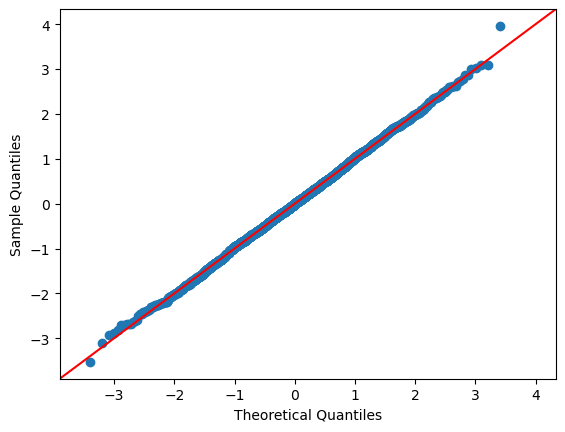

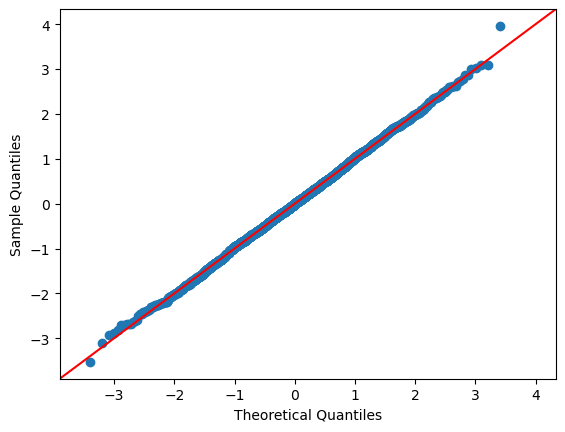

In [329]:
#Generate Q-Q Plot for reduced model
qqplot(data=age_pred_model.resid, fit=True, line='45')

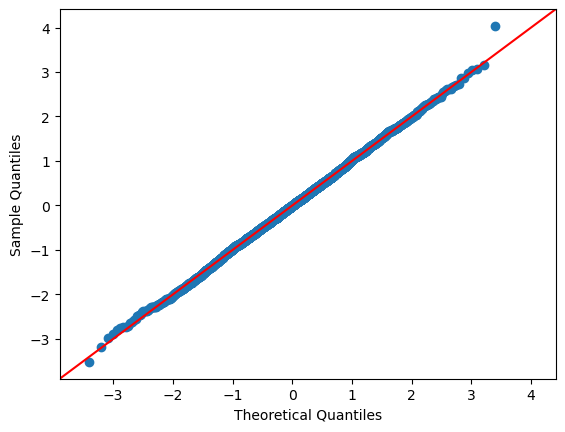

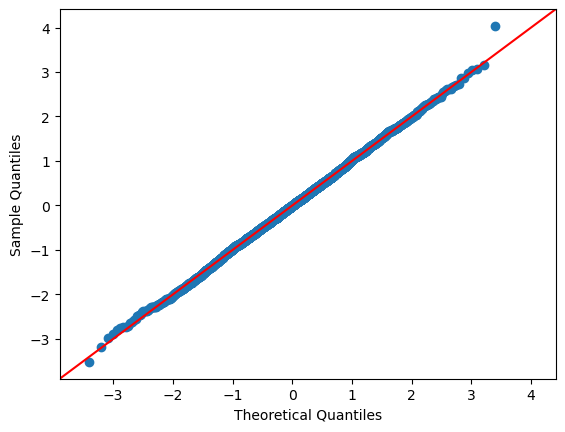

In [330]:
#Generate Q-Q Plot
qqplot(data=model1.resid, fit=True, line='45')